In [29]:
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import LineString
from shapely import to_geojson

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import manhattan_distances, euclidean_distances, pairwise_distances
from sklearn.metrics import davies_bouldin_score
from sklearn.cluster import KMeans, AgglomerativeClustering

import libpysal
import spopt
import esda
import networkx as nx
import pygeoda

import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.gridspec as gridspec
import contextily as ctx

import folium
from folium.plugins import GroupedLayerControl
from jinja2 import Template

import os
from pathlib import Path

from src import config, utils, plotting, algorithms, evaluation

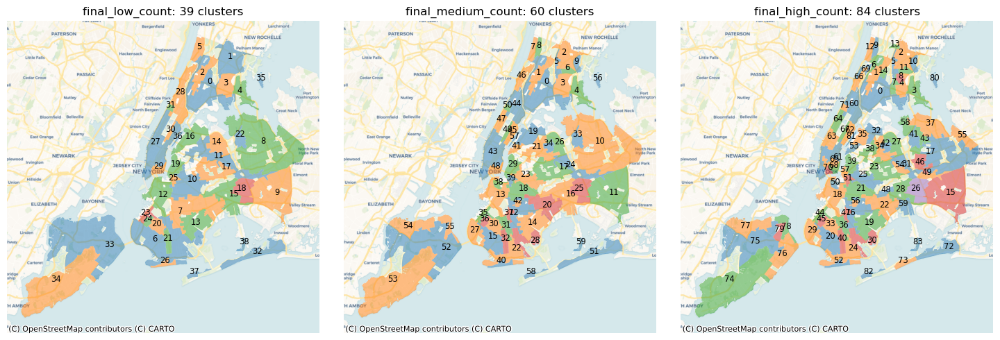

In [2]:
# Load in features and add frac_black back in for interpretability; it was removed to prevent collinearity in model fitting)
features = pd.read_parquet(config.FEATURES_11)
features.insert(0, "frac_black", 
                1 - features[["frac_white","frac_hispanic","frac_raceother"]].sum(axis=1)
)
feature_attrs = features.columns
features_std = pd.DataFrame(
    StandardScaler().fit_transform(features),
    index=features.index,
    columns=features.columns
)

# Load in geometries and join with feature info
tracts = gpd.read_parquet(config.TRACTS_CLEAN)
nyc_demographics = tracts.join(features)
nyc_demographics_std = tracts.join(features_std)

# Load in clustering labels and join to full dataset
final_model_names = ["final_low_count", "final_medium_count", "final_high_count"]
for model_name in final_model_names:
    model = pd.read_parquet(config.MODEL_DIR / f"~{model_name}.parquet")
    nyc_demographics = nyc_demographics.join(model)
    nyc_demographics_std = nyc_demographics_std.join(model)

# Load NTAs
ntas = gpd.read_parquet(config.NYC_NTAS_CLEAN)

# Plot side by side
fig, ax = plt.subplots(1,3, figsize=(15, 5))
for i, model_name in enumerate(final_model_names):
    __, __ = plotting.plot_clusters(nyc_demographics, model_name,
                                    figax=(fig, ax[i]))
    
    NC = len(nyc_demographics[model_name].unique())

    ax[i].set_title(f"{model_name}: {NC} clusters")

In [3]:
DOCS_DIR = Path("docs")
MAP_DIR = DOCS_DIR / "maps"
MAPDATA_DIR = MAP_DIR / "data"
FIGURE_DIR = DOCS_DIR / "figures"

os.makedirs(DOCS_DIR, exist_ok=True)
os.makedirs(MAP_DIR, exist_ok=True)
os.makedirs(MAPDATA_DIR, exist_ok=True)
os.makedirs(FIGURE_DIR, exist_ok=True)

# Folium

In [6]:
MAP_FILE = MAP_DIR / "map_clusters.html"

## Save cluster and NTA GeoJSON

According to ChatGPT, it's fine to directly embed GeoJSON into the HTML file as long as the file size stays under 5 MB (for fast loading). Still, it's probably good practice to save the files separately. I'm putting them in `docs/maps/data`, for the eventual Folium map to be in `docs/maps`.

In [5]:
model_names = ["final_low_count", "final_medium_count", "final_high_count"]
for model_name in model_names:
    # Make clusters
    clusters = utils.aggregate_clusters(nyc_demographics, feature_attrs, model_name)
    clusters = clusters.drop(columns=[
        "AREA","LAT","LONG"
    ])

    # Convert to WGS84 lat/lon if not already (Folium expects this)
    clusters = clusters.to_crs(config.WGS84_EPSG)

    # Simplify geometries to reduce file size (tolerance in degrees)
    clusters["geometry"] = clusters.geometry.simplify(
        tolerance=0.00001,           # ~1 meter at NYC latitude (1 deg ~ 100 km for most latitudes)
        preserve_topology=True
    )
    clusters.index.name = "label"

    # Save to GeoJSON
    file_name = f"clusters_{model_name[6:]}.geojson"
    clusters.to_file(MAPDATA_DIR / file_name, driver="GeoJSON")

In [6]:
# Load in and simplify NTA GeoDataFrame
ntas = gpd.read_parquet(config.NYC_NTAS_CLEAN)
ntas = ntas[[
    "boroname", "nta2020", "ntaname", "ntaabbrev", "geometry"
]]

# Convert to WGS84 lat/lon if not already (Folium expects this)
ntas = ntas.to_crs(config.WGS84_EPSG)

# Simplify geometries to reduce file size (tolerance in degrees)
ntas["geometry"] = ntas.geometry.simplify(
    tolerance=0.00001,           # ~1 meter at NYC latitude (1 deg ~ 100 km for most latitudes)
    preserve_topology=True
)
ntas.index.name = "label"

# Save to GeoJSON
file_name = "ntas.geojson"
ntas.to_file(MAPDATA_DIR / file_name, driver="GeoJSON")

In [7]:
# Load in and simplify NTA GeoDataFrame
tracts = gpd.read_parquet(config.TRACTS_CLEAN)

# Convert to WGS84 lat/lon if not already (Folium expects this)
tracts = tracts.to_crs(config.WGS84_EPSG)

# Simplify geometries to reduce file size (tolerance in degrees)
tracts["geometry"] = tracts.geometry.simplify(
    tolerance=0.00001,           # ~1 meter at NYC latitude (1 deg ~ 100 km for most latitudes)
    preserve_topology=True
)
tracts.index.name = "label"

# Save to GeoJSON
file_name = "tracts.geojson"
tracts.to_file(MAPDATA_DIR / file_name, driver="GeoJSON")

## Create Map object

In [8]:
cluster_files = [ MAPDATA_DIR / f"clusters_{count}_count.geojson" for count in ["low","medium","high"]]
nta_file = MAPDATA_DIR / "ntas.geojson"
tract_file = MAPDATA_DIR / "tracts.geojson"

cluster_gdfs = [gpd.read_file(file) for file in cluster_files]
ntas = gpd.read_file(nta_file)
tracts = gpd.read_file(tract_file)

In [9]:
# Greedy color using networkx
for i, clusters in enumerate(cluster_gdfs):
    cluster_labels = clusters.index.to_numpy()
    w = libpysal.weights.Queen.from_dataframe(clusters, 
                            use_index=False, silence_warnings=True)
    G = w.to_networkx()
    coloring = nx.algorithms.coloring.greedy_color(G)

    # Assign colors to the coloring (using the default matplotlib colors)
    default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    colormap = pd.Series({
        cluster_labels[idx]: default_colors[coloring[idx]] \
        for idx in coloring
    }, name="color", index=clusters.index)
    cluster_gdfs[i] = clusters.join(colormap)

cluster_gdfs[0].head()

,label,frac_black,frac_hispanic,frac_white,frac_raceother,medianage,frac_workingage,medianhouseholdincome,popdensity_sqmi,frac_housing_20plusunits,frac_commute_walk,frac_foreignborn,frac_households_married,geometry,color
0,0,0.291741,0.638221,0.017806,0.035577,33.6,0.625348,36181.0,65036.111036,0.692,0.0690,0.2840,0.223754,"MULTIPOLYGON (((-73.90902 40.80604, -73.90896 ...",#1f77b4
1,1,0.547380,0.289011,0.036190,0.067757,37.6,0.631710,70423.5,38538.473313,0.317,0.0370,0.3650,0.286766,"MULTIPOLYGON (((-73.8668 40.85095, -73.86861 4...",#1f77b4
2,2,0.188272,0.708711,0.022109,0.049628,33.5,0.647639,44646.0,116687.055353,0.781,0.0915,0.4435,0.260748,"POLYGON ((-73.91846 40.82557, -73.92026 40.826...",#ff7f0e
3,3,0.126310,0.483336,0.071880,0.173333,34.9,0.638624,59138.0,52312.796328,0.260,0.0780,0.3550,0.366412,"POLYGON ((-73.85645 40.82674, -73.85675 40.826...",#ff7f0e
4,4,0.070613,0.487635,0.345161,0.082929,39.4,0.640850,90032.0,23797.621853,0.059,0.0240,0.2000,0.388404,"POLYGON ((-73.82464 40.82477, -73.82749 40.825...",#2ca02c


In [10]:
## -- Get tract boundaries (unique) for map plotting --
df = tracts[["geometry"]].explode(ignore_index=True).copy()
df['geometry'] = df.geometry.boundary

# Get linestrings
linestrings = []
for index, row in df.iterrows():
    if isinstance(row["geometry"], LineString):
        linestrings += [row["geometry"]]
    else:
        # MultiLineString
        linestrings += list(row["geometry"].geoms)

# Get line segments
def explodeLine(linestring):
    """A function to return all segments of a line as a list of linestrings"""
    coords = linestring.coords #Create a list of all line node coordinates
    parts = []
    for part in zip(coords, coords[1:]): #For each start and end coordinate pair
        parts.append(LineString(part)) #Create a linestring and append to parts list
    return( parts )

segments = []
for linestring in linestrings:
    segments += explodeLine(linestring)
    
df_segments = gpd.GeoDataFrame(
    np.array(segments)[:,None],
    columns=["geometry"],
    crs=df.crs,
    geometry="geometry"
)
tract_boundaries_split = df_segments.normalize().drop_duplicates()
tract_boundaries_geojson = to_geojson(tract_boundaries_split.union_all())

In [14]:
# Centered on NYC
m = folium.Map(location=(40.71, -73.95), 
               zoom_start = 10,
               tiles=None)
folium.TileLayer("CartoDB Voyager", name='Basemap').add_to(m)

# Add the GeoJSON layer directly
cluster_versions = {
    "Low count (39)": {"gdf": cluster_gdfs[0]},
    "Medium count (60)": {"gdf": cluster_gdfs[1]},
    "High count (84)": {"gdf": cluster_gdfs[2]}
}

# -- Grouped Layer Control --
fgs = []

# Actual cluster groups
for name, cluster_dict in cluster_versions.items():
    fg = folium.FeatureGroup(name=name)
    folium.GeoJson(
        cluster_dict["gdf"],
        name=name,
        style_function = lambda feature: {
            "fillColor": feature["properties"]["color"],
            "color": "gray",
            "weight": 1,
            "fillOpacity": 0.5,
        },
        overlay=False,
        tooltip=folium.GeoJsonTooltip(fields=["label"], aliases=["Cluster"])
    ).add_to(fg)
    m.add_child(fg)
    fgs.append(fg)

# Empty group
fg = folium.FeatureGroup(name="None")
folium.Rectangle(
    bounds=[[40.7099, -73.9501],[40.7101, -73.9499]],
    style_function = lambda feature: {
        "weight": 0,
        "fillOpacity": 0
    }
).add_to(fg)
fg.add_to(m)
fgs.append(fg)

# Add tract layer
fg_tracts = folium.FeatureGroup(name="Census Tracts", show=False)
folium.GeoJson(
    tract_boundaries_geojson,
    name="Census Tracts",
    style_function=lambda feature: {
        "fillColor": "gray",
        "fillOpacity": 0,
        "color": "gray",
        "weight": 1,
        "dashArray": "4 6"
    }
).add_to(fg_tracts)
fg_tracts.add_to(m)

# Add NTA layer
fg_nbd = folium.FeatureGroup(name="Neighborhoods", show=False)
folium.GeoJson(
    ntas,
    name="Neighborhoods",
    style_function=lambda feature: {
        "fillColor": "gray",
        "fillOpacity": 0,
        "color": "black",
        "weight": 1
    }#,
    # tooltip=folium.GeoJsonTooltip(fields=["ntaname"], aliases=["Neighborhood"])  # optional
).add_to(fg_nbd)
fg_nbd.add_to(m)

fg_nbd_labels = folium.FeatureGroup(name="Neighborhood labels", show=False)
label_width = 100
label_height = 20
label_size = (label_width, label_height)

# Calculate icon_anchor for centering
label_anchor = (label_width / 2, label_height / 2)
for _, row in ntas.iterrows():
    point = row.geometry.representative_point()
    folium.map.Marker(
        [point.y, point.x],
        icon=folium.DivIcon(
            html=f"""<div style="font-size:8pt; font-weight:bold; color: black; text-align: center; vertical-align: middle; line-height: 20px;">{row['ntaabbrev']}</div>""",
            icon_size=label_size,
            icon_anchor=label_anchor
        )
    ).add_to(fg_nbd_labels)
fg_nbd_labels.add_to(m)

folium.LayerControl(collapsed=False).add_to(m)

GroupedLayerControl(
    groups={'Cluster number': fgs},
    collapsed=False,
).add_to(m)

m.save(MAP_FILE)

# K Means plot

In [4]:
# Define name of clustering model
alg = algorithms.kmeans
NC = 10
NF = len(features.columns)
model_name = f"f{NF}_{alg.code}_n{NC}"

# Set up clustering
nyc_demographics = tracts.join(features_std)
attrs = features_std.columns

# Solve
labels = alg(nyc_demographics, attrs, n=NC, seed=42)
labels.name = model_name

# Join with geometries
nyc_demographics = nyc_demographics.join(labels)

Text(0.5, 1.0, 'K-Means, 10 clusters')

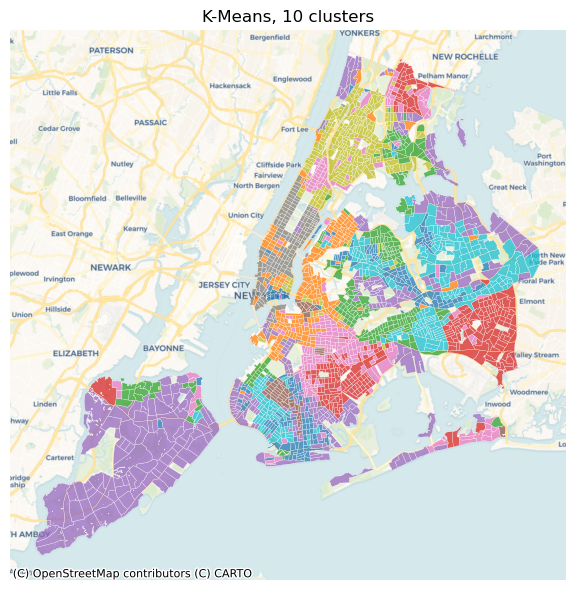

In [10]:
# Plot labels as categorical data
fig, ax = plt.subplots(figsize=(8,6))
__, __ = plotting.plot_categorical(nyc_demographics, model_name, figax=(fig,ax))
ax.set_title(f"K-Means, {NC} clusters")

In [11]:
FIG_KMEANS_FILE = FIGURE_DIR / "kmeans_clusters.png"

fig.savefig(FIG_KMEANS_FILE, dpi=300)

# Williamsburg gentrification (2 tract, 2 plot)

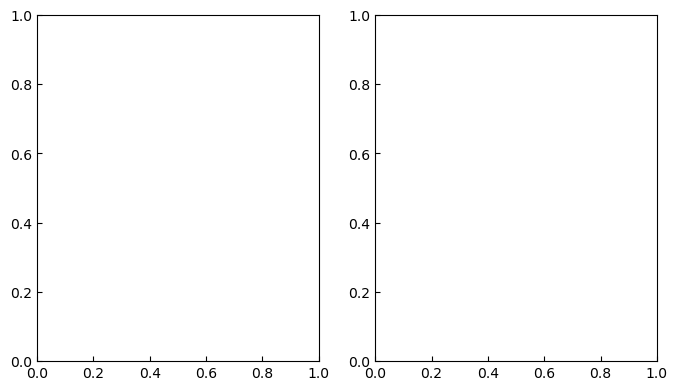

In [273]:
gdf = nyc_demographics.copy()
cluster_attr = "final_medium_count"
which_clusters = [29, 23]
plotted_attrs = ["frac_white", "medianhouseholdincome"]
figax = None

# Set up figure
fig = plt.figure(figsize=(8, 4.5))
gs = gridspec.GridSpec(1, 2, width_ratios=[4,4])
ax2 = fig.add_subplot(gs[0])
ax3 = fig.add_subplot(gs[1])

In [274]:
## --Geography plot--
default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colormap = pd.Series(default_colors[:2], index=which_clusters)
color_clusters = True

# Function
# Aggregate clusters into a gdf
clusters = utils.aggregate_clusters(gdf, [], cluster_attr)
clusters = clusters.to_crs(config.WEB_MERCATOR_EPSG)

# Restrict clusters gdf to those specified in which_clusters
if which_clusters != "all":
    assert isinstance(which_clusters, list)
    clusters = clusters.loc[which_clusters]

if color_clusters:
    if isinstance(colormap, str) and colormap == "greedy":
        # Greedy color using networkx
        cluster_labels = clusters.index.to_numpy()
        w = libpysal.weights.Queen.from_dataframe(clusters, 
                                use_index=False, silence_warnings=True)
        G = w.to_networkx()
        coloring = nx.algorithms.coloring.greedy_color(G)

        # Assign colors to the coloring (using the default matplotlib colors)
        default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
        colormap = pd.Series({
            cluster_labels[idx]: default_colors[coloring[idx]] \
            for idx in coloring
        })
    else:
        # Expect a colormap to be provided
        assert isinstance(colormap, pd.Series)

    # Plot
    clusters.plot(
        ax=ax2, color=colormap, edgecolor="k",
        linewidth=1, alpha=0.5
    )
else:
    # Plot only outlines
    clusters.plot(
        ax=ax2, facecolor="none", edgecolor="k",
        linewidth=1
    )

# Annotate labels
for idx, row in clusters.iterrows():
    ax2.annotate(text=str(int(idx)), 
                xy=row.geometry.representative_point().coords[0],
                horizontalalignment='center', fontsize="small",
                color=plotting._adjust_lightness(colormap.loc[idx], 0.5))

# Improve visualization
ax2.set_title(cluster_attr, fontsize=12)
ax2.axis("off")  # Remove axis labels for a clean map
ax2.set_aspect("equal")

# Custom zoom
ax2.set_xlim(-8234760, -8228541)
ax2.set_ylim(4968000, 4974500)

# bbox regularization
bbox_aspect = 1
xmin, xmax = ax2.get_xlim()
ymin, ymax = ax2.get_ylim()
x0, y0 = (xmin+xmax)/2, (ymin+ymax)/2
dx, dy = (xmax-xmin)/2, (ymax-ymin)/2

# Grow extent to match bbox aspect
if bbox_aspect * dy > dx:
    dx = dy * bbox_aspect
else:
    dy = dx / bbox_aspect
xmin_new, xmax_new = x0 - dx, x0 + dx
ymin_new, ymax_new = y0 - dy, y0 + dy
ax2.set_xlim(xmin_new, xmax_new)
ax2.set_ylim(ymin_new, ymax_new)

fig.tight_layout()

# Add basemap
ctx.add_basemap(ax2, 
                crs=config.WEB_MERCATOR_EPSG,
                source=config.DEFAULT_CTX_PROVIDER,
                reset_extent=True,
                zoom_adjust=0
                )

ax2.set_title("Cluster geographies")

Text(0.5, 1.0, 'Cluster geographies')

<Figure size 640x480 with 0 Axes>

In [275]:
annotate = True
annotation_col = "ntaabbrev"
gdf = ntas.copy()

# Convert CRS
gdf = gdf.to_crs(config.WEB_MERCATOR_EPSG)

# Plot only outlines
gdf.plot(
    ax=ax2, facecolor="none", edgecolor="#444444",
    linewidth=0.5, linestyle="dashed"
)

# Optional: annotate NTAs
if annotate:
    for idx, row in gdf.iterrows():
        ax2.annotate(text=row[annotation_col], 
                    xy=row.geometry.representative_point().coords[0],
                    horizontalalignment='center', fontsize="xx-small", color='#444444', zorder=1.5, clip_on=True)

# Improve visualization
ax2.axis("off")  # Remove axis labels for a clean map
ax2.set_aspect("equal")

fig.tight_layout()

In [276]:
gdf = nyc_demographics.copy()
cluster_attr = "final_medium_count"
which_clusters = [29, 23]
plotted_attrs = ["frac_white", "medianhouseholdincome"]
figax = None

# Scatter plot
# Get clusters
clusters = df.groupby(by=cluster_attr)
c0, c1 = which_clusters
cluster_c0 = clusters.get_group(c0)
cluster_c1 = clusters.get_group(c1)

# Get matrices, centroids, and variances
X0 = cluster_c0[feature_attrs].to_numpy()
X1 = cluster_c1[feature_attrs].to_numpy()
mu0, mu1 = np.mean(X0, axis=0), np.mean(X1, axis=0)
std0, std1 = np.std(X0, axis=0), np.std(X1, axis=0)

# Get attrs to plot
if plotted_attrs == "auto":
    # Find two dimensions with maximum separation scores
    separations = np.abs(mu1 - mu0) / (std0 + std1)
    dim_y, dim_x = np.argsort(separations)[-2:]
    attr_y, attr_x = feature_attrs[dim_y], feature_attrs[dim_x]
else:
    # Find two dimensions specified by plotted_attrs
    assert isinstance(plotted_attrs, list)
    assert len(plotted_attrs) == 2
    attr_x, attr_y = plotted_attrs
    dim_x = np.argmax(feature_attrs == attr_x)
    dim_y = np.argmax(feature_attrs == attr_y)
    
# Plot data
ax3.scatter(X0[:,dim_x], X0[:,dim_y] / 1000, s=5, c="C0", label=f"Cluster {c0}",
            zorder=1.7)
ax3.scatter(X1[:,dim_x], X1[:,dim_y] / 1000, s=5, c="C1", label=f"Cluster {c1}",
            zorder=1.7)
ax3.scatter([mu0[dim_x]], [mu0[dim_y]/1000], s=50, c="C0", edgecolor="k",
            zorder=1.8, label="Centroids")
ax3.scatter([mu1[dim_x]], [mu1[dim_y]/1000], s=50, c="C1", edgecolor="k",
            zorder=1.8)

# Confidence ellipses
confidence_level = 0.8
ellipse0_x, ellipse0_y = utils.get_confidence_ellipse(
    X0[:,[dim_x, dim_y]], confidence_level
)
ellipse1_x, ellipse1_y = utils.get_confidence_ellipse(
    X1[:,[dim_x, dim_y]], confidence_level
)
t = np.arange(0,1,0.001)
ax3.fill(ellipse0_x(t), ellipse0_y(t)/1000,
        color='C0', alpha=0.25, zorder=1.6,
        label="80% confid.")
ax3.fill(ellipse1_x(t), ellipse1_y(t)/1000,
        color='C1', alpha=0.25, zorder=1.6)

# Prettify
ax3.set_xlabel("Frac. non-Hispanic white")
ax3.set_ylabel("Median household income")
ax3.set_xlim((0,1))
ax3.set_title("Feature scatter plot")
ax3.legend(handlelength=1, labelspacing=0.25)
ax3.grid()
ax3.tick_params(axis="both", direction="in")
# y tick labels
labels = [f"${item.get_text()}k" for item in ax3.get_yticklabels()]
ax3.set_yticks(ax3.get_yticks())
ax3.set_yticklabels(labels)


fig.tight_layout()
fig.suptitle(f"Williamsburg cluster boundaries")    
fig.tight_layout()
ax = np.array([ax2,ax3])

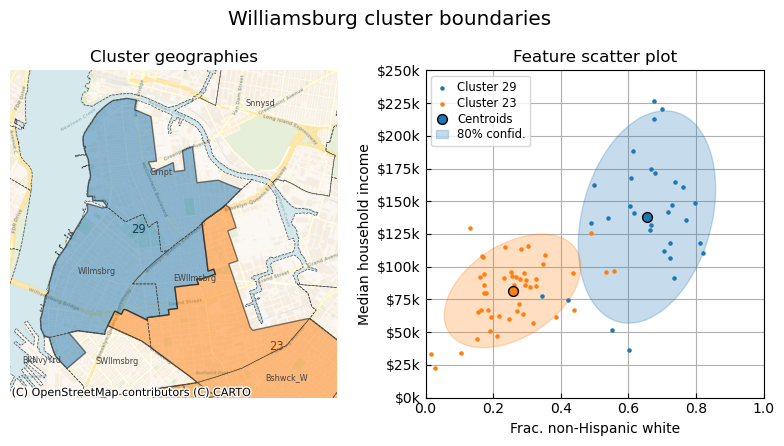

In [277]:
fig

In [ ]:
# FIG_WILLIAMSBURG = FIGURE_DIR / "williamsburg.png"

# fig.savefig(FIG_WILLIAMSBURG, dpi=300)

# Williamsburg gentrification (3 tract, 2 plot)

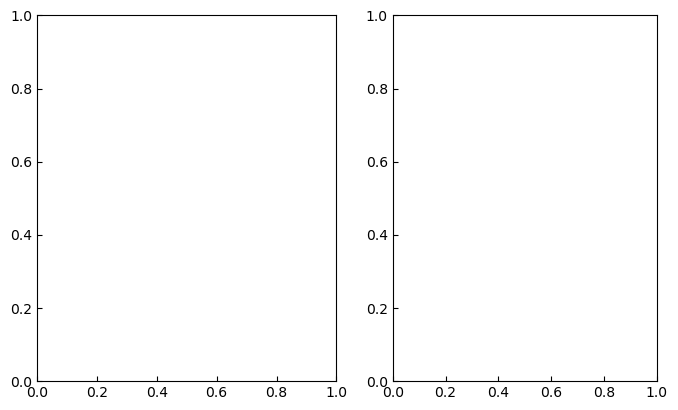

In [436]:
gdf = nyc_demographics.copy()
cluster_attr = "final_medium_count"
which_clusters = [29, 23, 39]
plotted_attrs = ["frac_white", "medianhouseholdincome"]
figax = None

# Set up figure
fig = plt.figure(figsize=(8, 4.75))
gs = gridspec.GridSpec(1, 2, width_ratios=[4.25, 3.75])
ax2 = fig.add_subplot(gs[0])
ax3 = fig.add_subplot(gs[1])

In [437]:
## --Geography plot--
default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colormap = pd.Series(default_colors[:3], index=which_clusters)
color_clusters = True

# Function
# Aggregate clusters into a gdf
clusters = utils.aggregate_clusters(gdf, [], cluster_attr)
clusters = clusters.to_crs(config.WEB_MERCATOR_EPSG)

# Restrict clusters gdf to those specified in which_clusters
if which_clusters != "all":
    assert isinstance(which_clusters, list)
    clusters = clusters.loc[which_clusters]

if color_clusters:
    if isinstance(colormap, str) and colormap == "greedy":
        # Greedy color using networkx
        cluster_labels = clusters.index.to_numpy()
        w = libpysal.weights.Queen.from_dataframe(clusters, 
                                use_index=False, silence_warnings=True)
        G = w.to_networkx()
        coloring = nx.algorithms.coloring.greedy_color(G)

        # Assign colors to the coloring (using the default matplotlib colors)
        default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
        colormap = pd.Series({
            cluster_labels[idx]: default_colors[coloring[idx]] \
            for idx in coloring
        })
    else:
        # Expect a colormap to be provided
        assert isinstance(colormap, pd.Series)

    # Plot
    clusters.plot(
        ax=ax2, color=colormap, edgecolor="k",
        linewidth=1, alpha=0.5
    )
else:
    # Plot only outlines
    clusters.plot(
        ax=ax2, facecolor="none", edgecolor="k",
        linewidth=1
    )

# Annotate labels
for idx, row in clusters.iterrows():
    ax2.annotate(text=str(int(idx)), 
                xy=row.geometry.representative_point().coords[0],
                horizontalalignment='center', fontsize="small",
                color=plotting._adjust_lightness(colormap.loc[idx], 0.5))

# Improve visualization
ax2.set_title(cluster_attr, fontsize=12)
ax2.axis("off")  # Remove axis labels for a clean map
ax2.set_aspect("equal")

# Custom zoom
ax2.set_xlim(-8234760, -8228541)
ax2.set_ylim(4967250, 4974000)

# bbox regularization
bbox_aspect = 0.9
xmin, xmax = ax2.get_xlim()
ymin, ymax = ax2.get_ylim()
x0, y0 = (xmin+xmax)/2, (ymin+ymax)/2
dx, dy = (xmax-xmin)/2, (ymax-ymin)/2

# Grow extent to match bbox aspect
if bbox_aspect * dy > dx:
    dx = dy * bbox_aspect
else:
    dy = dx / bbox_aspect
xmin_new, xmax_new = x0 - dx, x0 + dx
ymin_new, ymax_new = y0 - dy, y0 + dy
ax2.set_xlim(xmin_new, xmax_new)
ax2.set_ylim(ymin_new, ymax_new)

fig.tight_layout()

# Add basemap
ctx.add_basemap(ax2, 
                crs=config.WEB_MERCATOR_EPSG,
                source=config.DEFAULT_CTX_PROVIDER,
                reset_extent=True,
                zoom_adjust=0
                )

ax2.set_title("Cluster geographies")

Text(0.5, 1.0, 'Cluster geographies')

<Figure size 640x480 with 0 Axes>

In [438]:
annotate = True
annotation_col = "ntaabbrev"
gdf = ntas.copy()

# Convert CRS
gdf = gdf.to_crs(config.WEB_MERCATOR_EPSG)

# Plot only outlines
gdf.plot(
    ax=ax2, facecolor="none", edgecolor="#444444",
    linewidth=0.5, linestyle="dashed"
)

# Optional: annotate NTAs
if annotate:
    for idx, row in gdf.iterrows():
        ax2.annotate(text=row[annotation_col], 
                    xy=row.geometry.representative_point().coords[0],
                    horizontalalignment='center', fontsize="xx-small", color='#444444', zorder=1.5, clip_on=True)

# Improve visualization
ax2.axis("off")  # Remove axis labels for a clean map
ax2.set_aspect("equal")

fig.tight_layout()

In [439]:
gdf = nyc_demographics.copy()
cluster_attr = "final_medium_count"
which_clusters = [29, 23, 39]
plotted_attrs = ["frac_white", "medianhouseholdincome"]
figax = None

# Scatter plot
# Get clusters
clusters = df.groupby(by=cluster_attr)
c0, c1, c2 = which_clusters
cluster_c0 = clusters.get_group(c0)
cluster_c1 = clusters.get_group(c1)
cluster_c2 = clusters.get_group(c2)

# Get matrices, centroids, and variances
X0 = cluster_c0[feature_attrs].to_numpy()
X1 = cluster_c1[feature_attrs].to_numpy()
X2 = cluster_c2[feature_attrs].to_numpy()
mu0, mu1 = np.mean(X0, axis=0), np.mean(X1, axis=0)
std0, std1 = np.std(X0, axis=0), np.std(X1, axis=0)
mu2, std2 = np.mean(X2, axis=0), np.std(X2, axis=0)

# Get attrs to plot
if plotted_attrs == "auto":
    # Find two dimensions with maximum separation scores
    separations = np.abs(mu1 - mu0) / (std0 + std1)
    dim_y, dim_x = np.argsort(separations)[-2:]
    attr_y, attr_x = feature_attrs[dim_y], feature_attrs[dim_x]
else:
    # Find two dimensions specified by plotted_attrs
    assert isinstance(plotted_attrs, list)
    assert len(plotted_attrs) == 2
    attr_x, attr_y = plotted_attrs
    dim_x = np.argmax(feature_attrs == attr_x)
    dim_y = np.argmax(feature_attrs == attr_y)
    
# Plot data
ax3.scatter(X0[:,dim_x], X0[:,dim_y] / 1000, s=5, c="C0", label=f"Census tracts",
            zorder=1.7)
ax3.scatter(X1[:,dim_x], X1[:,dim_y] / 1000, s=5, c="C1",
            zorder=1.7)
# ax3.scatter(X2[:,dim_x], X2[:,dim_y] / 1000, s=5, c="C2",
#             zorder=1.7)
ax3.scatter([mu0[dim_x]], [mu0[dim_y]/1000], s=50, c="C0", edgecolor="k",
            zorder=1.8, label="Cluster centroids")
ax3.scatter([mu1[dim_x]], [mu1[dim_y]/1000], s=50, c="C1", edgecolor="k",
            zorder=1.8)
# ax3.scatter([mu2[dim_x]], [mu2[dim_y]/1000], s=50, c="C2", edgecolor="k",
#             zorder=1.8)

# Confidence ellipses
confidence_level = 0.8
ellipse0_x, ellipse0_y = utils.get_confidence_ellipse(
    X0[:,[dim_x, dim_y]], confidence_level
)
ellipse1_x, ellipse1_y = utils.get_confidence_ellipse(
    X1[:,[dim_x, dim_y]], confidence_level
)
ellipse2_x, ellipse2_y = utils.get_confidence_ellipse(
    X2[:,[dim_x, dim_y]], confidence_level
)
t = np.arange(0,1,0.001)
ax3.fill(ellipse0_x(t), ellipse0_y(t)/1000,
        color='C0', alpha=0.25, zorder=1.6,
        label="80% confid. ellipse")
ax3.fill(ellipse1_x(t), ellipse1_y(t)/1000,
        color='C1', alpha=0.25, zorder=1.6)
# ax3.fill(ellipse2_x(t), ellipse2_y(t)/1000,
#         color='C2', alpha=0.25, zorder=1.6)
ax3.text(0.58,235,s=f"Cluster {c0}", color=plotting._adjust_lightness(colormap.loc[c0], 0.5))
ax3.text(0.17,133,s=f"Cluster {c1}", color=plotting._adjust_lightness(colormap.loc[c1], 0.5))

# Prettify
ax3.set_xlabel("Frac. non-Hispanic white")
ax3.set_ylabel("Median household income")
ax3.set_xlim((0,1))
ax3.set_title("Feature scatter plot")
ax3.legend(handlelength=1, labelspacing=0.25)
ax3.grid()
ax3.tick_params(axis="both", direction="in")
# y tick labels
labels = [f"${item.get_text()}k" for item in ax3.get_yticklabels()]
ax3.set_yticks(ax3.get_yticks())
ax3.set_yticklabels(labels)
ax3.tick_params(axis='x', pad=5)


fig.tight_layout()
fig.suptitle(f"Clusters in Williamsburg/Greenpoint (medium count)")    
fig.tight_layout()
ax = np.array([ax2,ax3])

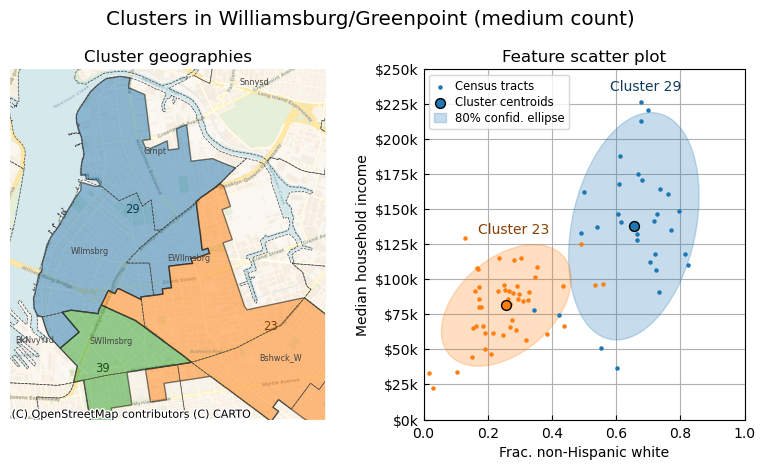

In [440]:
fig

In [441]:
FIG_WILLIAMSBURG = FIGURE_DIR / "williamsburg.png"

fig.savefig(FIG_WILLIAMSBURG, dpi=300)

# Williamsburg gentrification (3 tract, 3 plot)

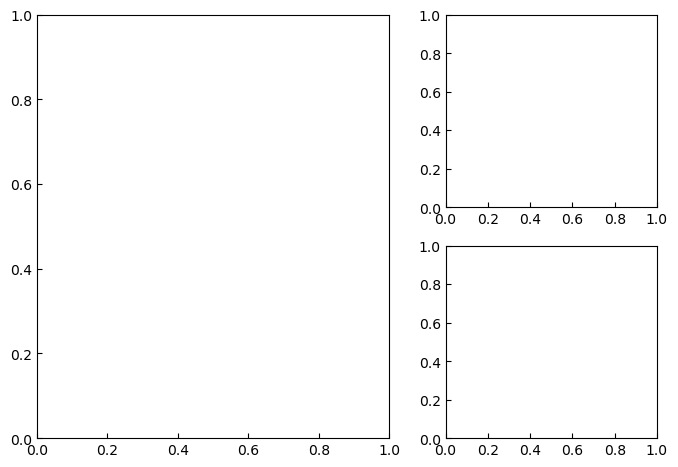

In [404]:
gdf = nyc_demographics.copy()
cluster_attr = "final_medium_count"
which_clusters = [29, 23, 39]
plotted_attrs = ["frac_white", "medianhouseholdincome"]
figax = None

# Set up figure
fig = plt.figure(figsize=(8, 5.5))
gs = gridspec.GridSpec(2, 2, width_ratios=[5,3], height_ratios=[1,1])
ax2 = fig.add_subplot(gs[:,0])
ax3 = fig.add_subplot(gs[0,1])
ax4 = fig.add_subplot(gs[1,1])

In [405]:
## --Geography plot--
default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colormap = pd.Series(default_colors[:3], index=which_clusters)
color_clusters = True

# Function
# Aggregate clusters into a gdf
clusters = utils.aggregate_clusters(gdf, [], cluster_attr)
clusters = clusters.to_crs(config.WEB_MERCATOR_EPSG)

# Restrict clusters gdf to those specified in which_clusters
if which_clusters != "all":
    assert isinstance(which_clusters, list)
    clusters = clusters.loc[which_clusters]

if color_clusters:
    if isinstance(colormap, str) and colormap == "greedy":
        # Greedy color using networkx
        cluster_labels = clusters.index.to_numpy()
        w = libpysal.weights.Queen.from_dataframe(clusters, 
                                use_index=False, silence_warnings=True)
        G = w.to_networkx()
        coloring = nx.algorithms.coloring.greedy_color(G)

        # Assign colors to the coloring (using the default matplotlib colors)
        default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
        colormap = pd.Series({
            cluster_labels[idx]: default_colors[coloring[idx]] \
            for idx in coloring
        })
    else:
        # Expect a colormap to be provided
        assert isinstance(colormap, pd.Series)

    # Plot
    clusters.plot(
        ax=ax2, color=colormap, edgecolor="k",
        linewidth=1, alpha=0.5
    )
else:
    # Plot only outlines
    clusters.plot(
        ax=ax2, facecolor="none", edgecolor="k",
        linewidth=1
    )

# Annotate labels
for idx, row in clusters.iterrows():
    ax2.annotate(text=str(int(idx)), 
                xy=row.geometry.representative_point().coords[0],
                horizontalalignment='center', fontsize="small",
                color=plotting._adjust_lightness(colormap.loc[idx], 0.5))

# Improve visualization
ax2.set_title(cluster_attr, fontsize=12)
ax2.axis("off")  # Remove axis labels for a clean map
ax2.set_aspect("equal")

# Custom zoom
ax2.set_xlim(-8234760, -8228541)
ax2.set_ylim(4967500, 4974000)

# bbox regularization
bbox_aspect = 0.8
xmin, xmax = ax2.get_xlim()
ymin, ymax = ax2.get_ylim()
x0, y0 = (xmin+xmax)/2, (ymin+ymax)/2
dx, dy = (xmax-xmin)/2, (ymax-ymin)/2

# Grow extent to match bbox aspect
if bbox_aspect * dy > dx:
    dx = dy * bbox_aspect
else:
    dy = dx / bbox_aspect
xmin_new, xmax_new = x0 - dx, x0 + dx
ymin_new, ymax_new = y0 - dy, y0 + dy
ax2.set_xlim(xmin_new, xmax_new)
ax2.set_ylim(ymin_new, ymax_new)

fig.tight_layout()

# Add basemap
ctx.add_basemap(ax2, 
                crs=config.WEB_MERCATOR_EPSG,
                source=config.DEFAULT_CTX_PROVIDER,
                reset_extent=True,
                zoom_adjust=0
                )

ax2.set_title("Cluster geographies")

Text(0.5, 1.0, 'Cluster geographies')

<Figure size 640x480 with 0 Axes>

In [406]:
annotate = True
annotation_col = "ntaabbrev"
gdf = ntas.copy()

# Convert CRS
gdf = gdf.to_crs(config.WEB_MERCATOR_EPSG)

# Plot only outlines
gdf.plot(
    ax=ax2, facecolor="none", edgecolor="#444444",
    linewidth=0.5, linestyle="dashed"
)

# Optional: annotate NTAs
if annotate:
    for idx, row in gdf.iterrows():
        ax2.annotate(text=row[annotation_col], 
                    xy=row.geometry.representative_point().coords[0],
                    horizontalalignment='center', fontsize="xx-small", color='#444444', zorder=1.5, clip_on=True)

# Improve visualization
ax2.axis("off")  # Remove axis labels for a clean map
ax2.set_aspect("equal")

fig.tight_layout()

In [407]:
gdf = nyc_demographics.copy()
cluster_attr = "final_medium_count"
which_clusters = [29, 23]
plotted_attrs = ["frac_white", "medianhouseholdincome"]
figax = None

# Scatter plot
# Get clusters
clusters = df.groupby(by=cluster_attr)
c0, c1 = which_clusters
cluster_c0 = clusters.get_group(c0)
cluster_c1 = clusters.get_group(c1)

# Get matrices, centroids, and variances
X0 = cluster_c0[feature_attrs].to_numpy()
X1 = cluster_c1[feature_attrs].to_numpy()
mu0, mu1 = np.mean(X0, axis=0), np.mean(X1, axis=0)
std0, std1 = np.std(X0, axis=0), np.std(X1, axis=0)

# Get attrs to plot
if plotted_attrs == "auto":
    # Find two dimensions with maximum separation scores
    separations = np.abs(mu1 - mu0) / (std0 + std1)
    dim_y, dim_x = np.argsort(separations)[-2:]
    attr_y, attr_x = feature_attrs[dim_y], feature_attrs[dim_x]
else:
    # Find two dimensions specified by plotted_attrs
    assert isinstance(plotted_attrs, list)
    assert len(plotted_attrs) == 2
    attr_x, attr_y = plotted_attrs
    dim_x = np.argmax(feature_attrs == attr_x)
    dim_y = np.argmax(feature_attrs == attr_y)
    
# Plot data
ax3.scatter(X0[:,dim_x], X0[:,dim_y] / 1000, s=5, c="C0", label=f"Census tracts",
            zorder=1.7)
ax3.scatter(X1[:,dim_x], X1[:,dim_y] / 1000, s=5, c="C1",
            zorder=1.7)
ax3.scatter([mu0[dim_x]], [mu0[dim_y]/1000], s=50, c="C0", edgecolor="k",
            zorder=1.8, label="Cluster centroids")
ax3.scatter([mu1[dim_x]], [mu1[dim_y]/1000], s=50, c="C1", edgecolor="k",
            zorder=1.8)

# Confidence ellipses
confidence_level = 0.8
ellipse0_x, ellipse0_y = utils.get_confidence_ellipse(
    X0[:,[dim_x, dim_y]], confidence_level
)
ellipse1_x, ellipse1_y = utils.get_confidence_ellipse(
    X1[:,[dim_x, dim_y]], confidence_level
)
t = np.arange(0,1,0.001)
ax3.fill(ellipse0_x(t), ellipse0_y(t)/1000,
        color='C0', alpha=0.25, zorder=1.6,
        label="80% confid. ellipse")
ax3.fill(ellipse1_x(t), ellipse1_y(t)/1000,
        color='C1', alpha=0.25, zorder=1.6)

# Prettify
ax3.set_xlabel("Frac. non-Hispanic white")
ax3.set_ylabel("Median household income")
ax3.set_xlim((0,1))
ax3.set_title("Feature scatter plots")
ax3.legend(handlelength=1, labelspacing=0.25)
ax3.grid()
ax3.tick_params(axis="both", direction="in")
# y tick labels
labels = [f"${item.get_text()}k" for item in ax3.get_yticklabels()]
ax3.set_yticks(ax3.get_yticks())
ax3.set_yticklabels(labels)

[Text(0, 0.0, '$0k'),
 Text(0, 50.0, '$50k'),
 Text(0, 100.0, '$100k'),
 Text(0, 150.0, '$150k'),
 Text(0, 200.0, '$200k'),
 Text(0, 250.0, '$250k')]

In [408]:
gdf = nyc_demographics.copy()
cluster_attr = "final_medium_count"
which_clusters = [29, 39]
plotted_attrs = "auto"
figax = None

# Scatter plot
# Get clusters
clusters = df.groupby(by=cluster_attr)
c0, c1 = which_clusters
cluster_c0 = clusters.get_group(c0)
cluster_c1 = clusters.get_group(c1)

# Get matrices, centroids, and variances
X0 = cluster_c0[feature_attrs].to_numpy()
X1 = cluster_c1[feature_attrs].to_numpy()
mu0, mu1 = np.mean(X0, axis=0), np.mean(X1, axis=0)
std0, std1 = np.std(X0, axis=0), np.std(X1, axis=0)

# Get attrs to plot
if plotted_attrs == "auto":
    # Find two dimensions with maximum separation scores
    separations = np.abs(mu1 - mu0) / (std0 + std1)
    dim_y, dim_x = np.argsort(separations)[-2:]
    attr_y, attr_x = feature_attrs[dim_y], feature_attrs[dim_x]
else:
    # Find two dimensions specified by plotted_attrs
    assert isinstance(plotted_attrs, list)
    assert len(plotted_attrs) == 2
    attr_x, attr_y = plotted_attrs
    dim_x = np.argmax(feature_attrs == attr_x)
    dim_y = np.argmax(feature_attrs == attr_y)
    
# Plot data
ax4.scatter(X0[:,dim_x], X0[:,dim_y], s=5, c="C0", label=f"Census tracts",
            zorder=1.7)
ax4.scatter(X1[:,dim_x], X1[:,dim_y], s=5, c="C2",
            zorder=1.7)
ax4.scatter([mu0[dim_x]], [mu0[dim_y]], s=50, c="C0", edgecolor="k",
            zorder=1.8, label="Cluster centroids")
ax4.scatter([mu1[dim_x]], [mu1[dim_y]], s=50, c="C2", edgecolor="k",
            zorder=1.8)

# Confidence ellipses
confidence_level = 0.8
ellipse0_x, ellipse0_y = utils.get_confidence_ellipse(
    X0[:,[dim_x, dim_y]], confidence_level
)
ellipse1_x, ellipse1_y = utils.get_confidence_ellipse(
    X1[:,[dim_x, dim_y]], confidence_level
)
t = np.arange(0,1,0.001)
ax4.fill(ellipse0_x(t), ellipse0_y(t),
        color='C0', alpha=0.25, zorder=1.6,
        label="80% confid. ellipse")
ax4.fill(ellipse1_x(t), ellipse1_y(t),
        color='C2', alpha=0.25, zorder=1.6)

# Prettify
ax4.set_xlabel("Frac. commuters who walk")
ax4.set_ylabel("Frac. married households")
ax4.set_xlim((0,1))
ax4.set_ylim((0,1))
ax4.legend(handlelength=1, labelspacing=0.25)
ax4.grid()
ax4.tick_params(axis="both", direction="in")

fig.tight_layout()
fig.suptitle(f"Williamsburg cluster boundaries")    
fig.tight_layout()
ax = np.array([[ax2,ax3],[ax2,ax4]])

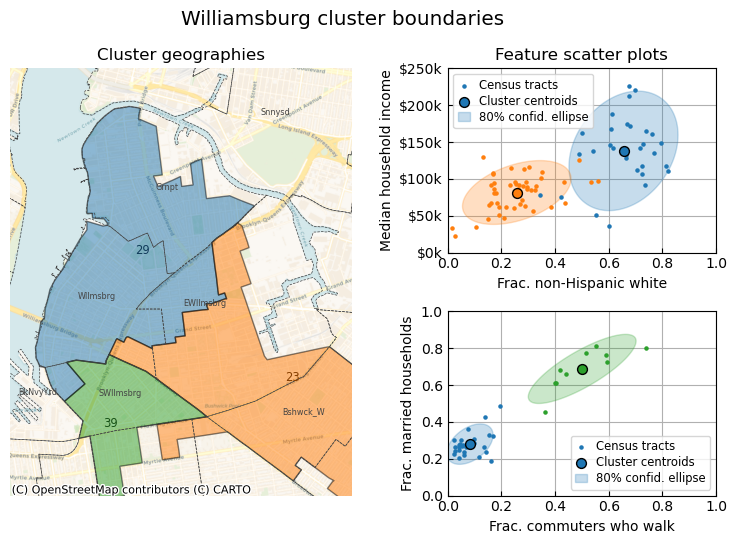

In [409]:
fig

In [ ]:
FIG_WILLIAMSBURG = FIGURE_DIR / "williamsburg.png"

fig.savefig(FIG_WILLIAMSBURG, dpi=300)

## Williamsburg gentrification (scratch)

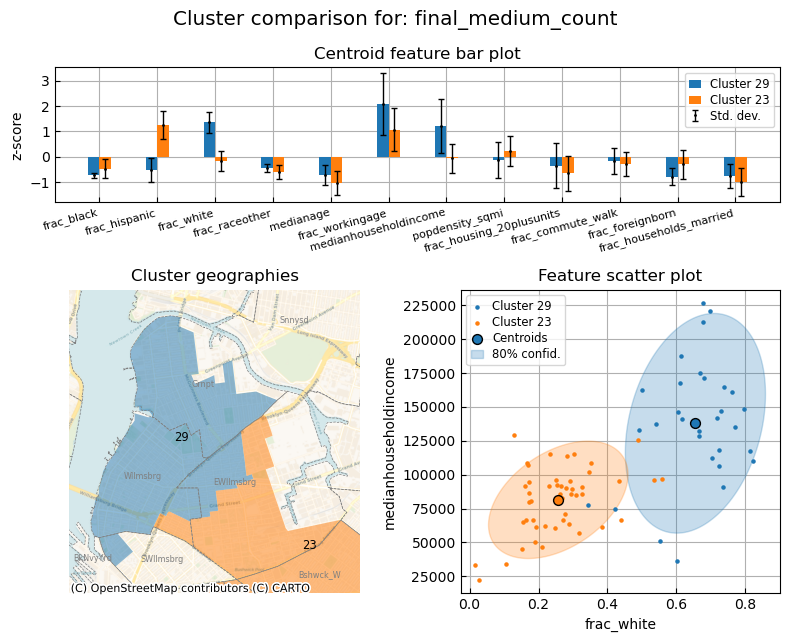

In [ ]:
fig, ax = plotting.plot_cluster_comparison_summary(
    nyc_demographics, feature_attrs, "final_medium_count",
    which_clusters=[29,23],plotted_attrs=["frac_white", "medianhouseholdincome"]
)
__, __ = plotting.plot_ntas(ntas, figax=(fig, ax[1,0]), annotate=True)
ax[1,0].set_xlim(-8234760, -8228541)
ax[1,0].set_ylim(4968000, 4974500)

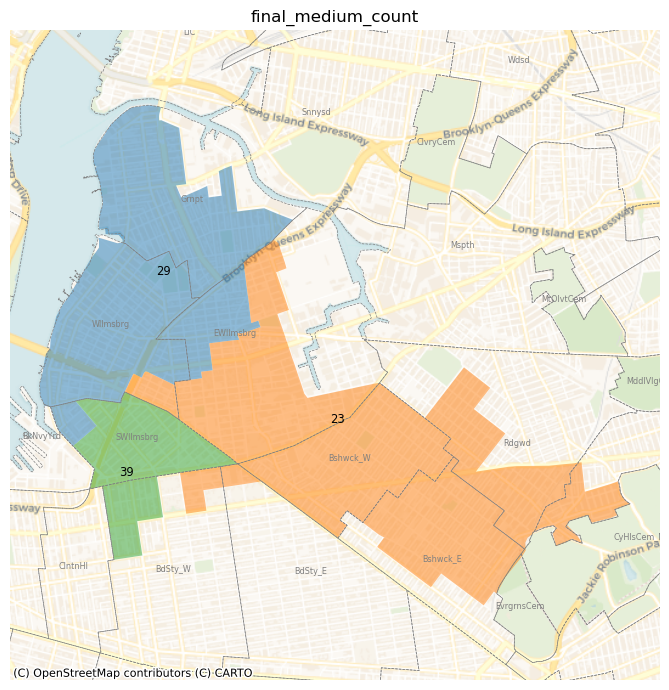

In [10]:
fig, ax = plotting.plot_clusters(nyc_demographics, "final_medium_count", which_clusters=[29,23,39])
__, __ = plotting.plot_ntas(ntas, figax=(fig,ax))

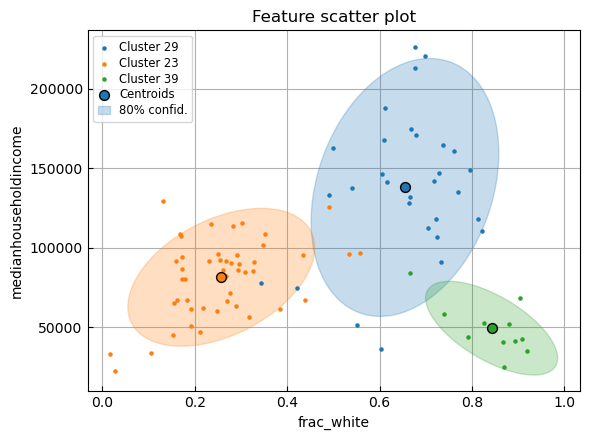

In [216]:
df = nyc_demographics.copy()
cluster_attr = "final_medium_count"
which_clusters = [29, 23, 39]
plotted_attrs = ["frac_white", "medianhouseholdincome"]
# plotted_attrs = ["frac_commute_walk", "frac_households_married"]
figax = None

# Get clusters
clusters = df.groupby(by=cluster_attr)
c0, c1, c2 = which_clusters
cluster_c0 = clusters.get_group(c0)
cluster_c1 = clusters.get_group(c1)
cluster_c2 = clusters.get_group(c2)

# Get matrices, centroids, and variances
X0 = cluster_c0[feature_attrs].to_numpy()
X1 = cluster_c1[feature_attrs].to_numpy()
X2 = cluster_c2[feature_attrs].to_numpy()
mu0, mu1 = np.mean(X0, axis=0), np.mean(X1, axis=0)
std0, std1 = np.std(X0, axis=0), np.std(X1, axis=0)
mu2, std2 = np.mean(X2, axis=0), np.std(X2, axis=0)

# Get attrs to plot
if plotted_attrs == "auto":
    # Find two dimensions with maximum separation scores
    separations = np.abs(mu1 - mu0) / (std0 + std1)
    dim_y, dim_x = np.argsort(separations)[-2:]
    attr_y, attr_x = feature_attrs[dim_y], feature_attrs[dim_x]
else:
    # Find two dimensions specified by plotted_attrs
    assert isinstance(plotted_attrs, list)
    assert len(plotted_attrs) == 2
    attr_x, attr_y = plotted_attrs
    dim_x = np.argmax(feature_attrs == attr_x)
    dim_y = np.argmax(feature_attrs == attr_y)

# Make plot
if figax is None:
    figsize = (6, 4.5)
    fig, ax = plt.subplots(figsize=figsize)
else:
    fig, ax = figax
    
# Plot data
ax.scatter(X0[:,dim_x], X0[:,dim_y], s=5, c="C0", label=f"Cluster {c0}",
            zorder=1.7)
ax.scatter(X1[:,dim_x], X1[:,dim_y], s=5, c="C1", label=f"Cluster {c1}",
            zorder=1.7)
ax.scatter(X2[:,dim_x], X2[:,dim_y], s=5, c="C2", label=f"Cluster {c2}",
            zorder=1.7)
ax.scatter([mu0[dim_x]], [mu0[dim_y]], s=50, c="C0", edgecolor="k",
            zorder=1.8, label="Centroids")
ax.scatter([mu1[dim_x]], [mu1[dim_y]], s=50, c="C1", edgecolor="k",
            zorder=1.8)
ax.scatter([mu2[dim_x]], [mu2[dim_y]], s=50, c="C2", edgecolor="k",
            zorder=1.8)

# Confidence ellipses
confidence_level = 0.8
ellipse0_x, ellipse0_y = utils.get_confidence_ellipse(
    X0[:,[dim_x, dim_y]], confidence_level
)
ellipse1_x, ellipse1_y = utils.get_confidence_ellipse(
    X1[:,[dim_x, dim_y]], confidence_level
)
ellipse2_x, ellipse2_y = utils.get_confidence_ellipse(
    X2[:,[dim_x, dim_y]], confidence_level
)
t = np.arange(0,1,0.001)
ax.fill(ellipse0_x(t), ellipse0_y(t),
        color='C0', alpha=0.25, zorder=1.6,
        label="80% confid.")
ax.fill(ellipse1_x(t), ellipse1_y(t),
        color='C1', alpha=0.25, zorder=1.6)
ax.fill(ellipse2_x(t), ellipse2_y(t),
        color='C2', alpha=0.25, zorder=1.6)

# Prettify
ax.set_xlabel(attr_x)
ax.set_ylabel(attr_y)
ax.set_title("Feature scatter plot")
ax.legend(handlelength=1, labelspacing=0.25)
ax.grid()
ax.tick_params(axis="both", direction="in")
fig.tight_layout()

Text(0.5, 1.0, 'final_medium_count: medianhouseholdincome')

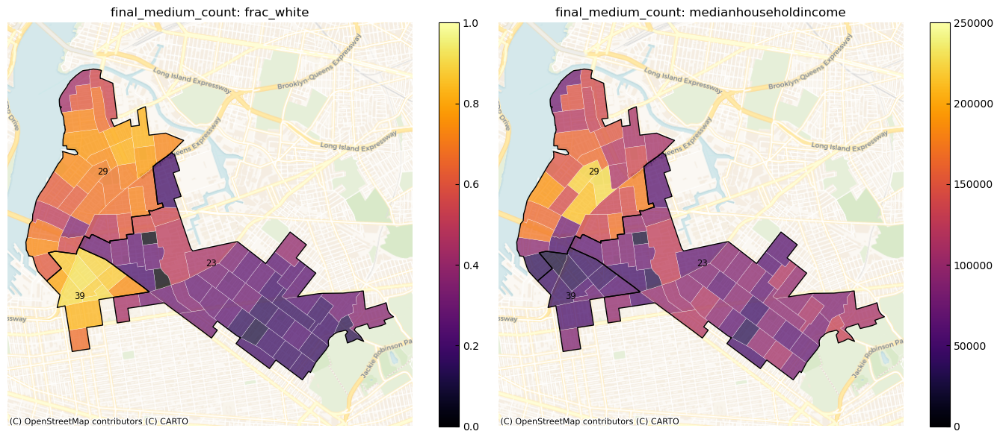

In [20]:
which_clusters = [29,23,39]
model_name = "final_medium_count"
attr_0 = "frac_white"
attr_1 = "medianhouseholdincome"

gdf_subset = utils.get_subset_by_clusters(nyc_demographics, model_name, which_clusters)

# Make plotting.plot_feature()
fig, ax = plt.subplots(1,2, figsize=(14,6))
__, __ = plotting.plot_feature(gdf_subset, attr_0, figax=(fig,ax[0]))
__, __ = plotting.plot_clusters(gdf_subset, model_name, color_clusters=False,
                                figax=(fig, ax[0]))
ax[0].set_title(f"{model_name}: {attr_0}")

__, __ = plotting.plot_feature(gdf_subset, attr_1,
                               vbounds=(0, nyc_demographics[attr_1].max()),
                               figax=(fig,ax[1]))
__, __ = plotting.plot_clusters(gdf_subset, model_name, color_clusters=False,
                                figax=(fig, ax[1]))
ax[1].set_title(f"{model_name}: {attr_1}")

# Forest Hills zoning (2 clusters, 2 plots)

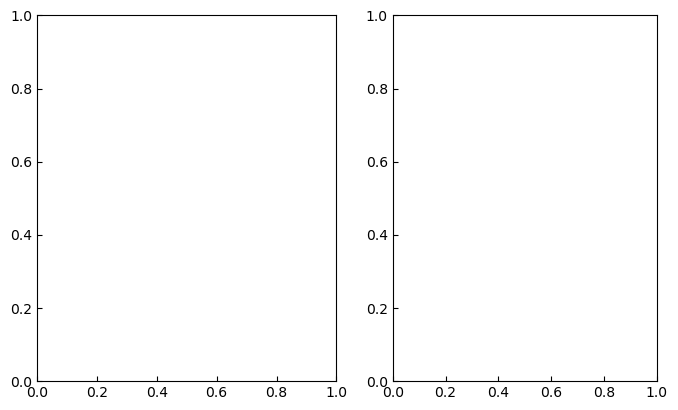

In [430]:
gdf = nyc_demographics.copy()
cluster_attr = "final_high_count"
which_clusters = [31, 54]
plotted_attrs = ["frac_housing_20plusunits", "frac_households_married"]
figax = None

# Set up figure
fig = plt.figure(figsize=(8, 4.75))
gs = gridspec.GridSpec(1, 2, width_ratios=[4.25, 3.75])
ax2 = fig.add_subplot(gs[0])
ax3 = fig.add_subplot(gs[1])

In [431]:
## --Geography plot--
default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colormap = pd.Series(default_colors[:2], index=which_clusters)
color_clusters = True

# Function
# Aggregate clusters into a gdf
clusters = utils.aggregate_clusters(gdf, [], cluster_attr)
clusters = clusters.to_crs(config.WEB_MERCATOR_EPSG)

# Restrict clusters gdf to those specified in which_clusters
if which_clusters != "all":
    assert isinstance(which_clusters, list)
    clusters = clusters.loc[which_clusters]

if color_clusters:
    if isinstance(colormap, str) and colormap == "greedy":
        # Greedy color using networkx
        cluster_labels = clusters.index.to_numpy()
        w = libpysal.weights.Queen.from_dataframe(clusters, 
                                use_index=False, silence_warnings=True)
        G = w.to_networkx()
        coloring = nx.algorithms.coloring.greedy_color(G)

        # Assign colors to the coloring (using the default matplotlib colors)
        default_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
        colormap = pd.Series({
            cluster_labels[idx]: default_colors[coloring[idx]] \
            for idx in coloring
        })
    else:
        # Expect a colormap to be provided
        assert isinstance(colormap, pd.Series)

    # Plot
    clusters.plot(
        ax=ax2, color=colormap, edgecolor="k",
        linewidth=1, alpha=0.5
    )
else:
    # Plot only outlines
    clusters.plot(
        ax=ax2, facecolor="none", edgecolor="k",
        linewidth=1
    )

# Annotate labels
for idx, row in clusters.iterrows():
    ax2.annotate(text=str(int(idx)), 
                xy=row.geometry.representative_point().coords[0],
                horizontalalignment='center', fontsize="small",
                color=plotting._adjust_lightness(colormap.loc[idx], 0.5))

# Improve visualization
ax2.set_title(cluster_attr, fontsize=12)
ax2.axis("off")  # Remove axis labels for a clean map
ax2.set_aspect("equal")

# Custom zoom
ax2.set_xlim(-8223000, -8217000)
ax2.set_ylim(4967250, 4974750)

# bbox regularization
bbox_aspect = 1
xmin, xmax = ax2.get_xlim()
ymin, ymax = ax2.get_ylim()
x0, y0 = (xmin+xmax)/2, (ymin+ymax)/2
dx, dy = (xmax-xmin)/2, (ymax-ymin)/2

# Grow extent to match bbox aspect
if bbox_aspect * dy > dx:
    dx = dy * bbox_aspect
else:
    dy = dx / bbox_aspect
xmin_new, xmax_new = x0 - dx, x0 + dx
ymin_new, ymax_new = y0 - dy, y0 + dy
ax2.set_xlim(xmin_new, xmax_new)
ax2.set_ylim(ymin_new, ymax_new)

fig.tight_layout()

# Add basemap
ctx.add_basemap(ax2, 
                crs=config.WEB_MERCATOR_EPSG,
                source=config.DEFAULT_CTX_PROVIDER,
                reset_extent=True,
                zoom_adjust=0
                )

ax2.set_title("Cluster geographies")

Text(0.5, 1.0, 'Cluster geographies')

<Figure size 640x480 with 0 Axes>

In [432]:
annotate = True
annotation_col = "ntaabbrev"
gdf = ntas.copy()

# Convert CRS
gdf = gdf.to_crs(config.WEB_MERCATOR_EPSG)

# Plot only outlines
gdf.plot(
    ax=ax2, facecolor="none", edgecolor="#444444",
    linewidth=0.5, linestyle="dashed"
)

# Optional: annotate NTAs
if annotate:
    for idx, row in gdf.iterrows():
        ax2.annotate(text=row[annotation_col], 
                    xy=row.geometry.representative_point().coords[0],
                    horizontalalignment='center', fontsize="xx-small", color='#444444', zorder=1.5, clip_on=True)

# Improve visualization
ax2.axis("off")  # Remove axis labels for a clean map
ax2.set_aspect("equal")

fig.tight_layout()

In [433]:
gdf = nyc_demographics.copy()
cluster_attr = "final_high_count"
which_clusters = [31, 54]
plotted_attrs = ["frac_housing_20plusunits", "frac_households_married"]
figax = None

# Scatter plot
# Get clusters
clusters = df.groupby(by=cluster_attr)
c0, c1 = which_clusters
cluster_c0 = clusters.get_group(c0)
cluster_c1 = clusters.get_group(c1)

# Get matrices, centroids, and variances
X0 = cluster_c0[feature_attrs].to_numpy()
X1 = cluster_c1[feature_attrs].to_numpy()
mu0, mu1 = np.mean(X0, axis=0), np.mean(X1, axis=0)
std0, std1 = np.std(X0, axis=0), np.std(X1, axis=0)

# Get attrs to plot
if plotted_attrs == "auto":
    # Find two dimensions with maximum separation scores
    separations = np.abs(mu1 - mu0) / (std0 + std1)
    dim_y, dim_x = np.argsort(separations)[-2:]
    attr_y, attr_x = feature_attrs[dim_y], feature_attrs[dim_x]
else:
    # Find two dimensions specified by plotted_attrs
    assert isinstance(plotted_attrs, list)
    assert len(plotted_attrs) == 2
    attr_x, attr_y = plotted_attrs
    dim_x = np.argmax(feature_attrs == attr_x)
    dim_y = np.argmax(feature_attrs == attr_y)
    
# Plot data
ax3.scatter(X0[:,dim_x], X0[:,dim_y], s=5, c="C0", label=f"Census tracts",
            zorder=1.7)
ax3.scatter(X1[:,dim_x], X1[:,dim_y], s=5, c="C1",
            zorder=1.7)
ax3.scatter([mu0[dim_x]], [mu0[dim_y]], s=50, c="C0", edgecolor="k",
            zorder=1.8, label="Cluster centroids")
ax3.scatter([mu1[dim_x]], [mu1[dim_y]], s=50, c="C1", edgecolor="k",
            zorder=1.8)

# Confidence ellipses
confidence_level = 0.8
ellipse0_x, ellipse0_y = utils.get_confidence_ellipse(
    X0[:,[dim_x, dim_y]], confidence_level
)
ellipse1_x, ellipse1_y = utils.get_confidence_ellipse(
    X1[:,[dim_x, dim_y]], confidence_level
)
t = np.arange(0,1,0.001)
ax3.fill(ellipse0_x(t), ellipse0_y(t),
        color='C0', alpha=0.25, zorder=1.6,
        label="80% confid. ellipse")
ax3.fill(ellipse1_x(t), ellipse1_y(t),
        color='C1', alpha=0.25, zorder=1.6)
ax3.text(0.65,0.47,s=f"Cluster {c0}", color=plotting._adjust_lightness(colormap.loc[c0], 0.5))
ax3.text(0.09,0.66,s=f"Cluster {c1}", color=plotting._adjust_lightness(colormap.loc[c1], 0.5))

# Prettify
ax3.set_xlabel("Frac. housing in 20+ unit buildings")
ax3.set_ylabel("Frac. married households")
ax3.set_xlim((-0.025,1))
ax3.set_ylim((0.3,0.7))
ax3.set_title("Feature scatter plot")
ax3.legend(handlelength=1, labelspacing=0.25)
ax3.grid()
ax3.tick_params(axis="both", direction="in")


fig.tight_layout()
fig.suptitle(f"Clusters in Forest Hills/Rego Park (high count)")    
fig.tight_layout()
ax = np.array([ax2,ax3])

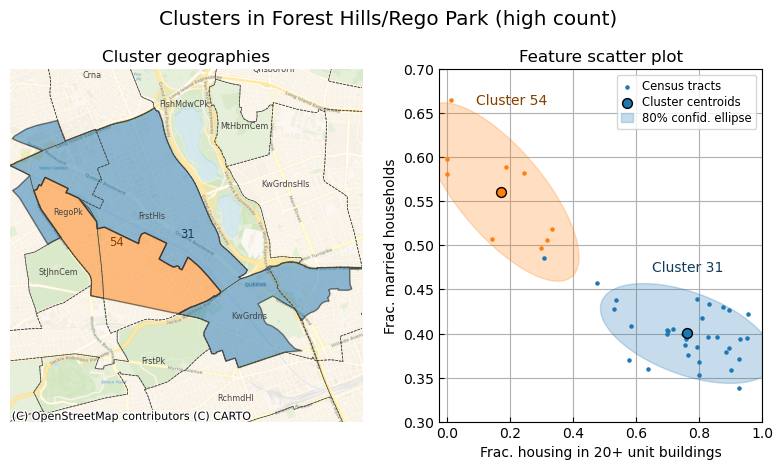

In [434]:
fig

In [435]:
FIG_FORESTHILLS = FIGURE_DIR / "foresthills.png"

fig.savefig(FIG_FORESTHILLS, dpi=300)

# Scratch

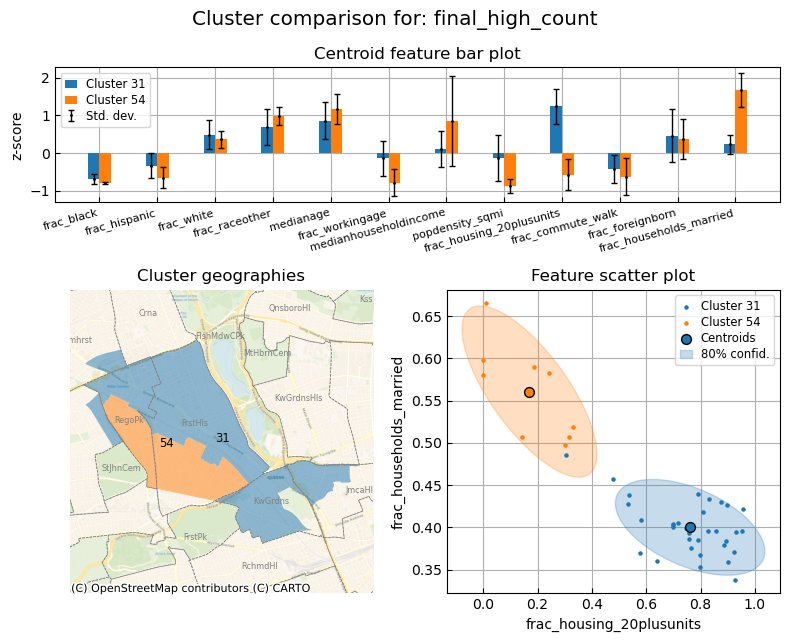

In [352]:
fig, ax = plotting.plot_cluster_comparison_summary(
    nyc_demographics, feature_attrs, "final_high_count",
    which_clusters=[31,54]
)
__, __ = plotting.plot_ntas(ntas, figax=(fig, ax[1,0]), annotate=True)

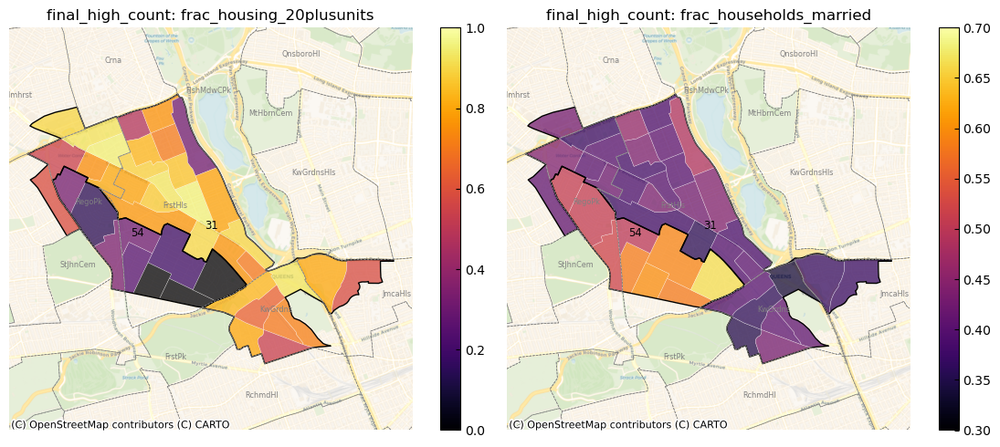

In [350]:
which_clusters = [31, 54]
model_name = "final_high_count"
attr1 = "frac_households_married"
attr0 = "frac_housing_20plusunits"

gdf_subset = utils.get_subset_by_clusters(nyc_demographics, model_name, which_clusters)

# Make plotting.plot_feature()
fig, ax = plt.subplots(1,2, figsize=(12,5))
__, __ = plotting.plot_feature(gdf_subset, attr0, figax=(fig, ax[0]))
__, __ = plotting.plot_clusters(gdf_subset, model_name, color_clusters=False,
                                figax=(fig, ax[0]))
ax[0].set_title(f"{model_name}: {attr0}")
__, __ = plotting.plot_ntas(ntas, figax=(fig, ax[0]), annotate=True)

__, __ = plotting.plot_feature(gdf_subset, attr1, vbounds=(0.3,0.7), figax=(fig, ax[1]))
__, __ = plotting.plot_clusters(gdf_subset, model_name, color_clusters=False,
                                figax=(fig, ax[1]))
ax[1].set_title(f"{model_name}: {attr1}")
__, __ = plotting.plot_ntas(ntas, figax=(fig, ax[1]), annotate=True)

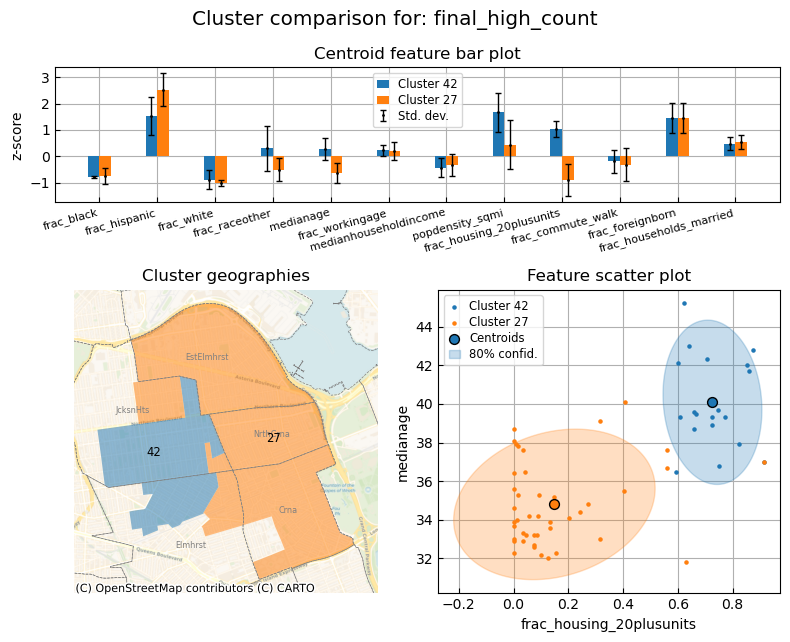

In [22]:
fig, ax = plotting.plot_cluster_comparison_summary(
    nyc_demographics, feature_attrs, "final_high_count",
    which_clusters=[42,27]
)
__, __ = plotting.plot_ntas(ntas, figax=(fig, ax[1,0]), annotate=True)

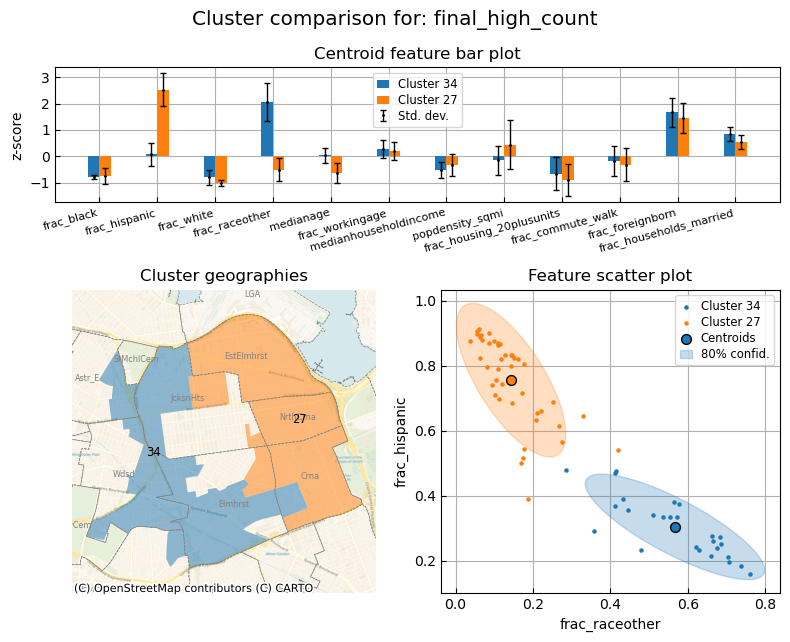

In [23]:
fig, ax = plotting.plot_cluster_comparison_summary(
    nyc_demographics, feature_attrs, "final_high_count",
    which_clusters=[34,27]
)
__, __ = plotting.plot_ntas(ntas, figax=(fig, ax[1,0]), annotate=True)

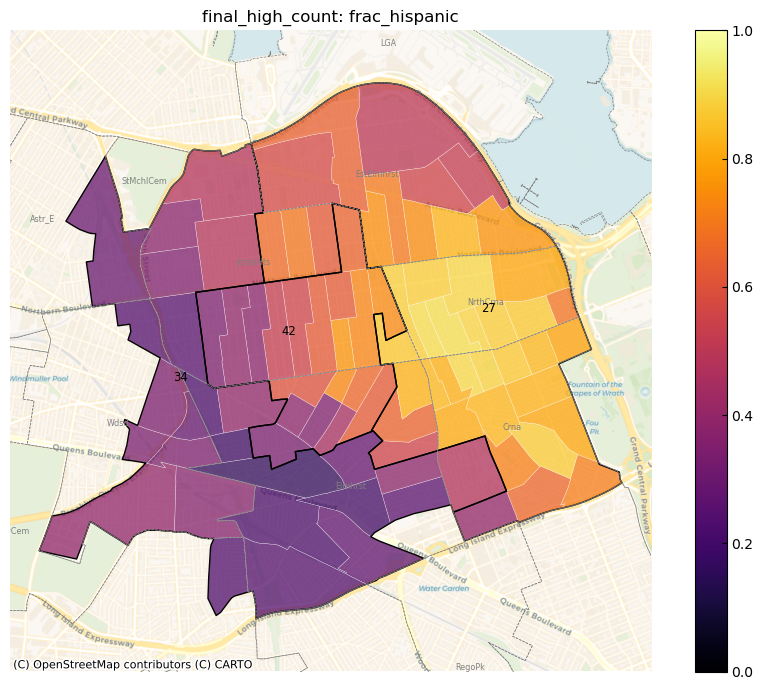

In [24]:
which_clusters = [34,42,27]
model_name = "final_high_count"
attr = "frac_hispanic"

gdf_subset = utils.get_subset_by_clusters(nyc_demographics, model_name, which_clusters)

# Make plotting.plot_feature()
fig, ax = plotting.plot_feature(gdf_subset, attr)
__, __ = plotting.plot_clusters(gdf_subset, model_name, color_clusters=False,
                                figax=(fig, ax))
ax.set_title(f"{model_name}: {attr}")
__, __ = plotting.plot_ntas(ntas, figax=(fig, ax), annotate=True)

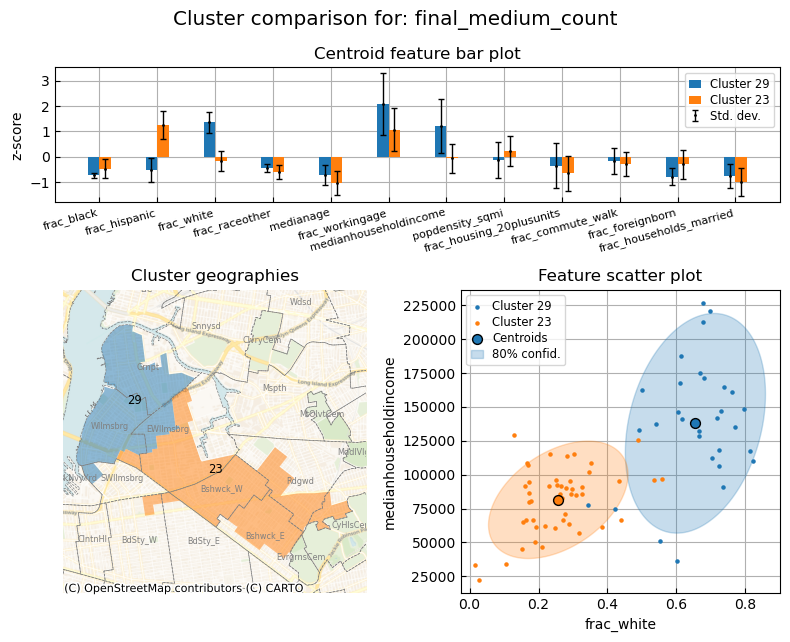

In [3]:
fig, ax = plotting.plot_cluster_comparison_summary(
    nyc_demographics, feature_attrs, "final_medium_count",
    which_clusters=[29,23],plotted_attrs=["frac_white", "medianhouseholdincome"]
)
__, __ = plotting.plot_ntas(ntas, figax=(fig, ax[1,0]), annotate=True)

Text(0.5, 1.0, 'final_medium_count: medianhouseholdincome')

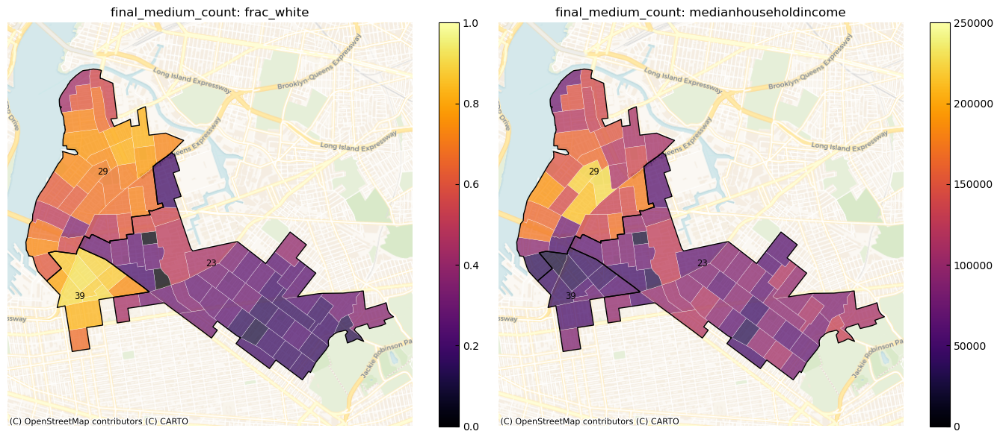

In [272]:
which_clusters = [29,23,39]
model_name = "final_medium_count"
attr_0 = "frac_white"
attr_1 = "medianhouseholdincome"

gdf_subset = utils.get_subset_by_clusters(nyc_demographics, model_name, which_clusters)

# Make plotting.plot_feature()
fig, ax = plt.subplots(1,2, figsize=(14,6))
__, __ = plotting.plot_feature(gdf_subset, attr_0, figax=(fig,ax[0]))
__, __ = plotting.plot_clusters(gdf_subset, model_name, color_clusters=False,
                                figax=(fig, ax[0]))
ax[0].set_title(f"{model_name}: {attr_0}")

__, __ = plotting.plot_feature(gdf_subset, attr_1,
                               vbounds=(0, nyc_demographics[attr_1].max()),
                               figax=(fig,ax[1]))
__, __ = plotting.plot_clusters(gdf_subset, model_name, color_clusters=False,
                                figax=(fig, ax[1]))
ax[1].set_title(f"{model_name}: {attr_1}")

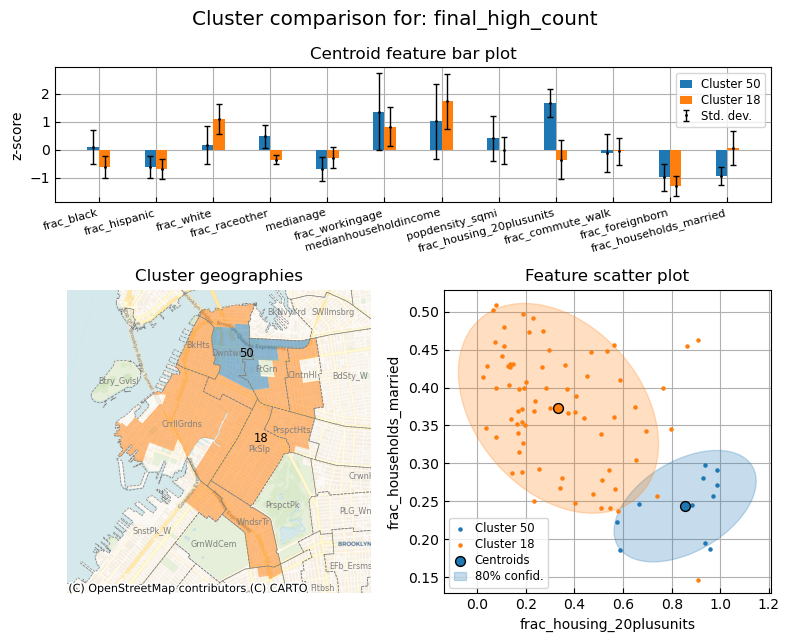

In [12]:
fig, ax = plotting.plot_cluster_comparison_summary(
    nyc_demographics, feature_attrs, "final_high_count",
    which_clusters=[50, 18]
)
__, __ = plotting.plot_ntas(ntas, figax=(fig, ax[1,0]), annotate=True)

In [12]:
utils.get_Morans_I(gdf_subset, feature_attrs)

frac_black                  0.504503
frac_hispanic               0.513077
frac_white                  0.489717
frac_raceother              0.592809
medianage                   0.410689
frac_workingage             0.377225
medianhouseholdincome       0.251094
popdensity_sqmi             0.065616
frac_housing_20plusunits    0.590639
frac_commute_walk           0.081382
frac_foreignborn            0.225243
frac_households_married     0.605774
Name: morans_I, dtype: float64

Text(0.5, 1.0, 'final_high_count: frac_workingage')

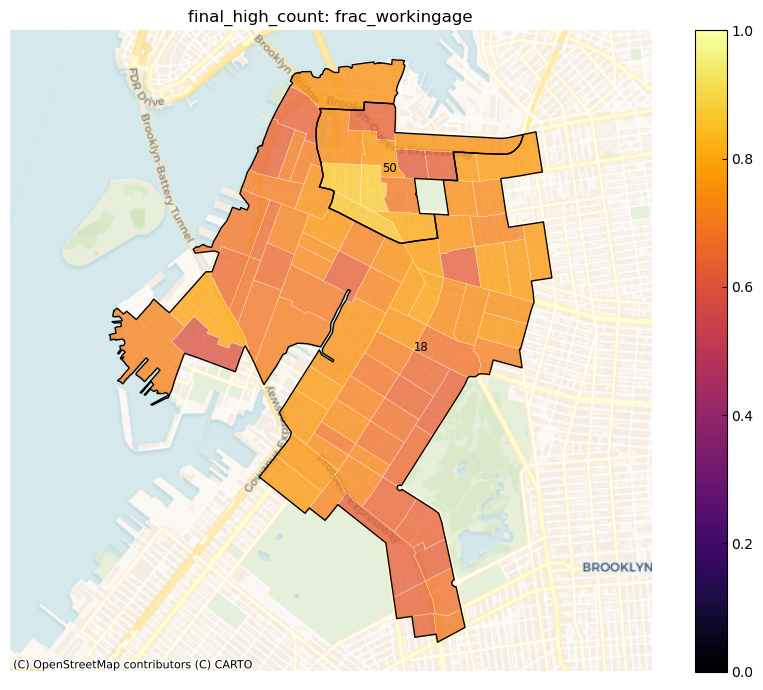

In [29]:
which_clusters = [50,18]
model_name = "final_high_count"
attr = "frac_workingage"

gdf_subset = utils.get_subset_by_clusters(nyc_demographics, model_name, which_clusters)

# Make plotting.plot_feature()
fig, ax = plotting.plot_feature(gdf_subset, attr)
__, __ = plotting.plot_clusters(gdf_subset, model_name, color_clusters=False,
                                figax=(fig, ax))
ax.set_title(f"{model_name}: {attr}")

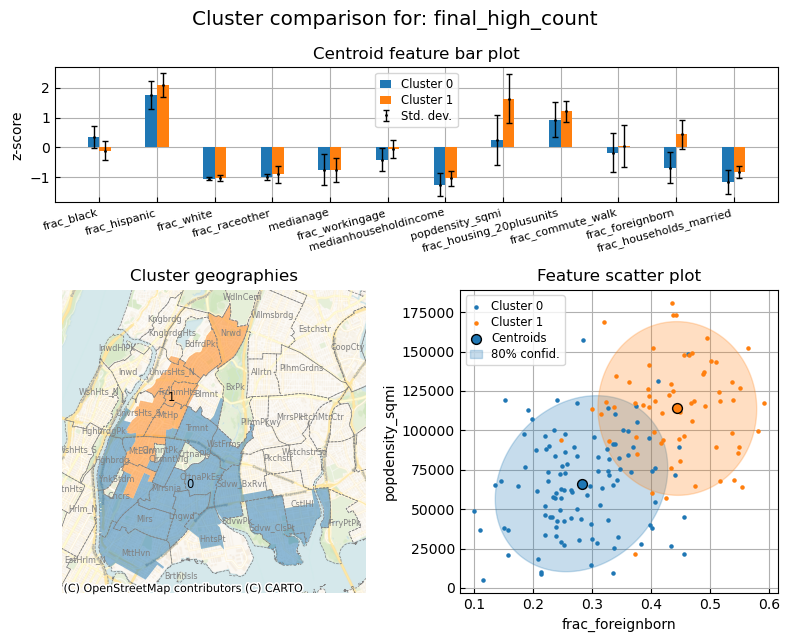

In [14]:
fig, ax = plotting.plot_cluster_comparison_summary(
    nyc_demographics, feature_attrs, "final_high_count",
    which_clusters=[0, 1]
)
__, __ = plotting.plot_ntas(ntas, figax=(fig, ax[1,0]), annotate=True)

Text(0.5, 1.0, 'final_high_count: popdensity_sqmi')

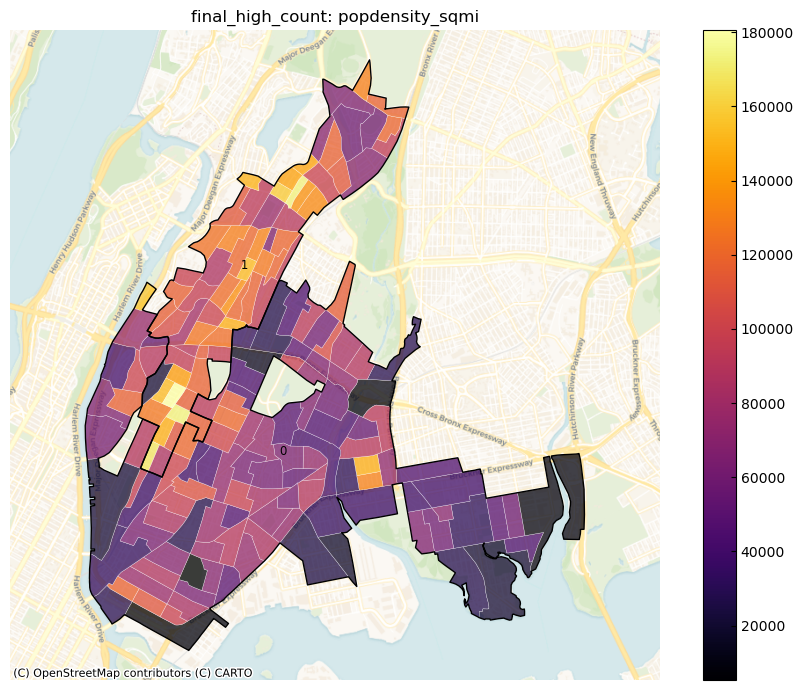

In [15]:
which_clusters = [0, 1]
model_name = "final_high_count"
attr = "popdensity_sqmi"

gdf_subset = utils.get_subset_by_clusters(nyc_demographics, model_name, which_clusters)

# Make plotting.plot_feature()
fig, ax = plotting.plot_feature(gdf_subset, attr)
__, __ = plotting.plot_clusters(gdf_subset, model_name, color_clusters=False,
                                figax=(fig, ax))
ax.set_title(f"{model_name}: {attr}")

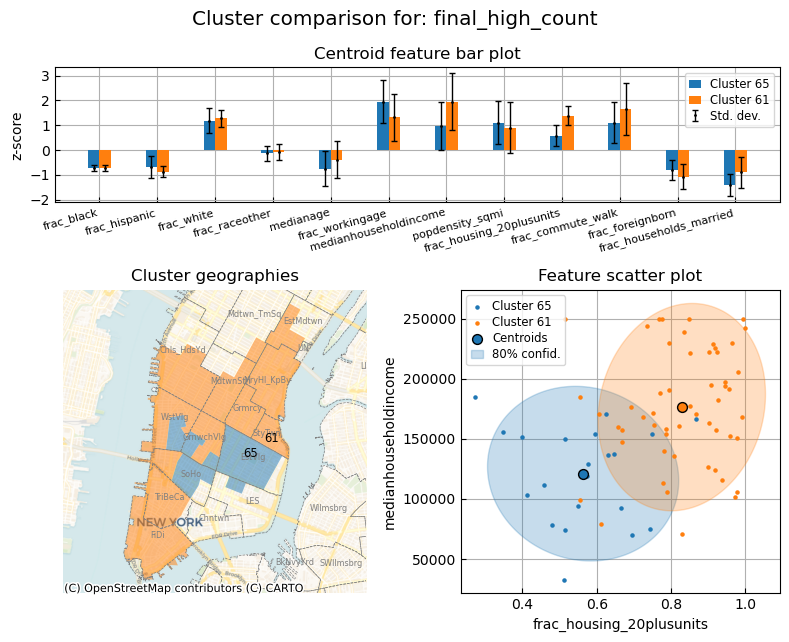

In [13]:
fig, ax = plotting.plot_cluster_comparison_summary(
    nyc_demographics, feature_attrs, "final_high_count",
    which_clusters=[65,61]
)
__, __ = plotting.plot_ntas(ntas, figax=(fig, ax[1,0]), annotate=True)

Text(0.5, 1.0, 'final_high_count: frac_raceother')

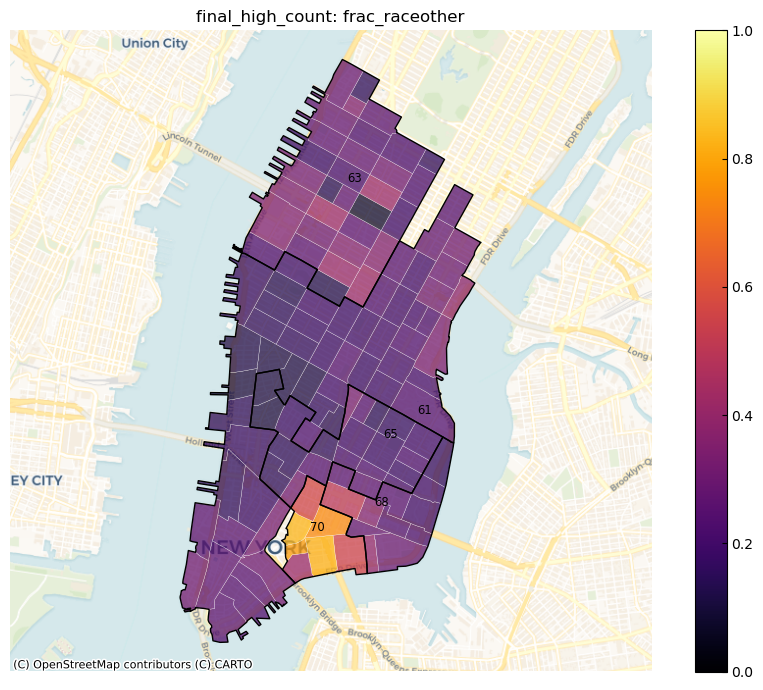

In [7]:
which_clusters = [65,61,63,68,70]
model_name = "final_high_count"
# attr = "medianhouseholdincome"
attr = "frac_raceother"

gdf_subset = utils.get_subset_by_clusters(nyc_demographics, model_name, which_clusters)

# Make plotting.plot_feature()
fig, ax = plotting.plot_feature(gdf_subset, attr)
__, __ = plotting.plot_clusters(gdf_subset, model_name, color_clusters=False,
                                figax=(fig, ax))
ax.set_title(f"{model_name}: {attr}")

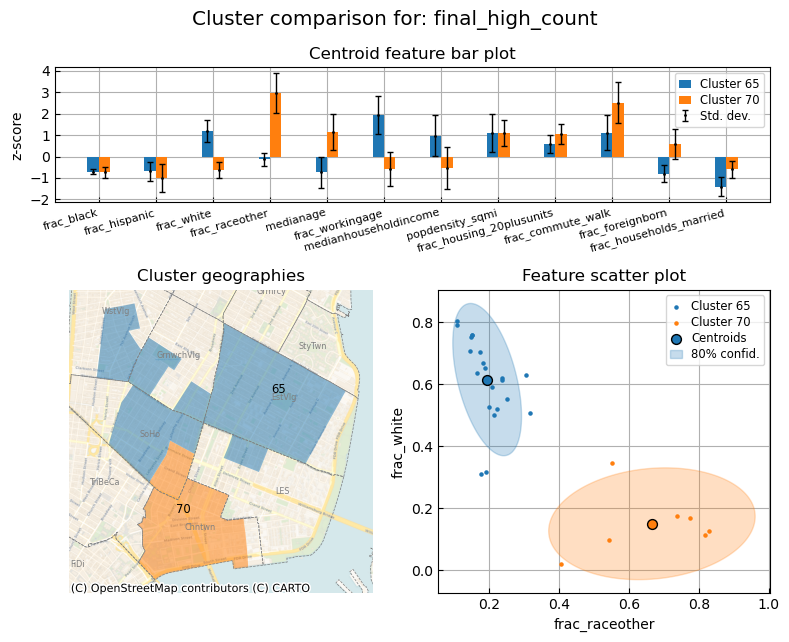

In [33]:
fig, ax = plotting.plot_cluster_comparison_summary(
    nyc_demographics, feature_attrs, "final_high_count",
    which_clusters=[65, 70]
)
__, __ = plotting.plot_ntas(ntas, figax=(fig, ax[1,0]), annotate=True)